# read clouds


tests to read total cloud cover files, plot with cartopy 

### For ECMWF

tutorial including plotting with metview see
https://colab.research.google.com/github/ecmwf/notebook-examples/blob/master/opencharts/medium-simulated-vis.ipynb#scrollTo=civic-genetics


for ECMWF forecasts ee
https://www.ecmwf.int/en/forecasts/accessing-forecasts


### For DWD ICON

regular grid total cloud cover
https://opendata.dwd.de/weather/nwp/icon-eu/grib/00/clct

script for downloading files see
https://github.com/giannisdravilas/Weather-Plotting/blob/main/geopHeight3d/icon_eu_geop500_3d.py


---------
### Installation

uses envs/env_clouds.yml - > "clouds" environment

on mac and linux install metview e.g. via brew first:

https://metview.readthedocs.io/en/latest/install.html#install

then install env "clouds"

made upgrade to cartopy==0.24.1, but uses numpy 1.24
installed pygrib-2.1.6

recheck construction of environment


-------------

### Issues:


- with "conda install -c conda-forge cfgrib" pandas does not work
https://github.com/ecmwf/cfgrib - cfgrib==0.9.15.0 with conda forge - does not work, metview does not load
- unsolved how to regrid icon, use icon-eu





In [13]:
import metview as mv
from ecmwfapi import *

from datetime import datetime
from datetime import timedelta
import eccodes
import requests
import xarray
import numpy
import pandas
import numpy as np
import matplotlib.pyplot as plt
import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.feature as carfeat

import pickle

import urllib
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.colors as mcolors

import os

#relative path of icon data
icon_eu_path='data/icon-eu/'

ecmwf_path='data/ecmwf/'


from auroramaps import util as au

print(cartopy.__version__)

%matplotlib inline
import warnings

# Suppress all warnings
warnings.filterwarnings("ignore")


#if new background images need to be saved in auroramaps/data/wmts do this, some are included!
#au.save_gibs_earth_image('BlueMarble_NextGeneration',300)    
#au.save_gibs_earth_image('VIIRS_CityLights_2012',300)    
#au.save_gibs_earth_image('BlueMarble_NextGeneration',600)    
#au.save_gibs_earth_image('VIIRS_CityLights_2012',600)    

#background image for maps
map_type='marble'
map_img=au.load_high_res_background(map_type)


#make sure to convert the current notebook to a script
os.system('jupyter nbconvert cloud_tests.ipynb  --to script')   

#read in ovation test data

#pickle.load()


0.24.1


[NbConvertApp] Converting notebook cloud_tests.ipynb to script
[NbConvertApp] Writing 12552 bytes to cloud_tests.py


0

### ECMWF example

In [14]:
#server = ECMWFService("mars")
#server.execute(
#    {
#    "class": "od",
#    "date": "0",
#    "expver": "1",
#    "levtype": "sfc",
#    "param": "260512",
#    "step": "12",
#    "stream": "oper",
#    "time": "00",
#    "type": "ssd",
#    "channel":"3/4",
#    "ident":"71",
#    "grid": "0.25/0.25"
#    },
#    filename)

filename = "medium-simulated-vis.grib"
#url = f"https://get.ecmwf.int/repository/opencharts-sample-data/{filename}"
#r = requests.get(url)
#with open(filename, 'wb') as file:
#    file.write(r.content)

data = mv.read(ecmwf_path+filename)
data.describe('cdrfl')
data.ls()
data = data * 100
cdrfl_3 = data.select(channel= 3)
cdrfl_4 = data.select(channel= 4)
    

#### Extract values and grid points

In [15]:
keys = mv.grib_get(data, ['shortName', 'dataDate', 'dataTime', 'stepRange', 'validityDate', 'validityTime'])
print(keys)


####### TO DO
#extract time
#run at dataDate and dataTime is valid stepRange into the future, so construct time for forecast like this:
#time_run_str=time_info[0][0][0:4]+'-'+time_info[0][0][4:6]+'-'+time_info[0][0][6:8]+' '+time_info[0][1][0:2]+':'+time_info[0][1][2:4]
#date_format = "%Y-%m-%d %H:%M"
#time_run=datetime.strptime(time_run_str, date_format)
#print('time of run',time_run)

#add step time to run time
#time_lead=int(time_info[0][2])
#print('forecast lead time:',time_lead, 'hours')

#time_icon=time_run+timedelta(hours=int(time_info[0][2]))
#print('time valid for forecast:',time_icon)
#print()
time_ecmwf='test'



min_val = mv.minvalue(data)
max_val = mv.maxvalue(data)
print(f"Min value: {min_val}, Max value: {max_val}")

location = [51, -1]  # Example: latitude, longitude
value_at_location = mv.nearest_gridpoint(data, location)
print(value_at_location)

max_val = mv.maxvalue(data[0])
max_location = mv.find(data[0], max_val)
print(max_location)
#Extract a time series at this location:

times = mv.valid_date(data)
vals_for_point = mv.nearest_gridpoint(data, max_location[0])
for time, value in zip(times, vals_for_point):
    print(time, value)


# Extract the data values and coordinates
lats, lons = mv.latitudes(data), mv.longitudes(data)
values = mv.values(data)

#there are 2 layers, use layer 0

lats=lats[0]
lons=lons[0]
values=values[0]

#print(np.size(lats),np.size(lons))
#print(np.size(values))

[['cdrfl', '20241230', '0000', '12', '20241230', '1200'], ['cdrfl', '20241230', '0000', '12', '20241230', '1200']]
Min value: 3.6724395751953125, Max value: 117.43083000183105
[37.78804016113281, 50.789594650268555]
[[-45.0, 286.75]]
2024-12-30 12:00:00 107.92353820800781
2024-12-30 12:00:00 117.34232902526855


# ICON

In [16]:
#total cloud cover

#### download a latest cloud cover file

#example
#https://opendata.dwd.de/weather/nwp/icon-eu/grib/00/clct/icon-eu_europe_regular-lat-lon_single-level_2025040800_000_CLCT.grib2

#check definitions
run='00'
hours_ahead='012' #always with zero
# Get today's date and create the appropriate format
today_run = datetime.utcnow().strftime("%Y%m%d")+run
print(run, hours_ahead, today_run)

fileicon='icon-eu_europe_regular-lat-lon_single-level_'+today_run+'_'+hours_ahead+'_CLCT.grib2.bz2'
url = 'https://opendata.dwd.de/weather/nwp/icon-eu/grib/'+run+'/clct/'+fileicon
fileicon_disk=icon_eu_path+fileicon

print(url)
print()
print('download latest ICON-EU cloud cover file as:')
print(fileicon_disk)
print()

#if file not there already, download:
if os.path.exists(fileicon_disk): print('File already here')

if os.path.exists(fileicon_disk)==False:
    try: 
        urllib.request.urlretrieve(url,fileicon_disk)
        os.system('bzip2 -d '+fileicon_disk)
    except urllib.error.URLError as e:
        print('not downloaded')

#decompressed file
fileicon_disk_d=icon_eu_path+'/icon-eu_europe_regular-lat-lon_single-level_'+today_run+'_'+hours_ahead+'_CLCT.grib2'
#read in file

data2 = mv.read(fileicon_disk_d)
data2.ls()
data2.describe()



00 012 2025040800
https://opendata.dwd.de/weather/nwp/icon-eu/grib/00/clct/icon-eu_europe_regular-lat-lon_single-level_2025040800_012_CLCT.grib2.bz2

download latest ICON-EU cloud cover file as:
data/icon-eu/icon-eu_europe_regular-lat-lon_single-level_2025040800_012_CLCT.grib2.bz2

File already here


parameter,typeOfLevel,level,date,time,step,number,paramId,class,stream,type,experimentVersionNumber
CLCT,surface,0,20250408,0,12,None,500046,None,None,None,None


In [17]:
#extract time
time_info = mv.grib_get(data2, ['dataDate', 'dataTime','stepRange'])

#run at dataDate and dataTime is valid stepRange into the future, so construct time for forecast like this:
time_run_str=time_info[0][0][0:4]+'-'+time_info[0][0][4:6]+'-'+time_info[0][0][6:8]+' '+time_info[0][1][0:2]+':'+time_info[0][1][2:4]
date_format = "%Y-%m-%d %H:%M"
time_run=datetime.strptime(time_run_str, date_format)
print('time of run',time_run)

#add step time to run time
time_lead=int(time_info[0][2])
print('forecast lead time:',time_lead, 'hours')

time_icon=time_run+timedelta(hours=int(time_info[0][2]))
print('time valid for forecast:',time_icon)
print()


#extract values and latitude longitude
#print(values2)
#print(np.size(values2))
# Extract the data values and coordinates
lats2, lons2 = mv.latitudes(data2), mv.longitudes(data2)
values2 = mv.values(data2)


#set low values to NAN
ind=np.where(values2 < 20)
values3=np.copy(values2)
values4=np.copy(values2)

values3[ind]=np.nan
values4[ind]=0

hist2, bin_edges = np.histogram(values2, bins=100)
hist4, bin_edges = np.histogram(values4, bins=100)

#plt.plot(hist2)
#plt.plot(hist4,marker='o')
#plt.scatter(lats2,lons2,c=values2,cmap='grey')

time of run 2025-04-08 00:00:00
forecast lead time: 12 hours
time valid for forecast: 2025-04-08 12:00:00



## Show in cartopy

## ECMWF

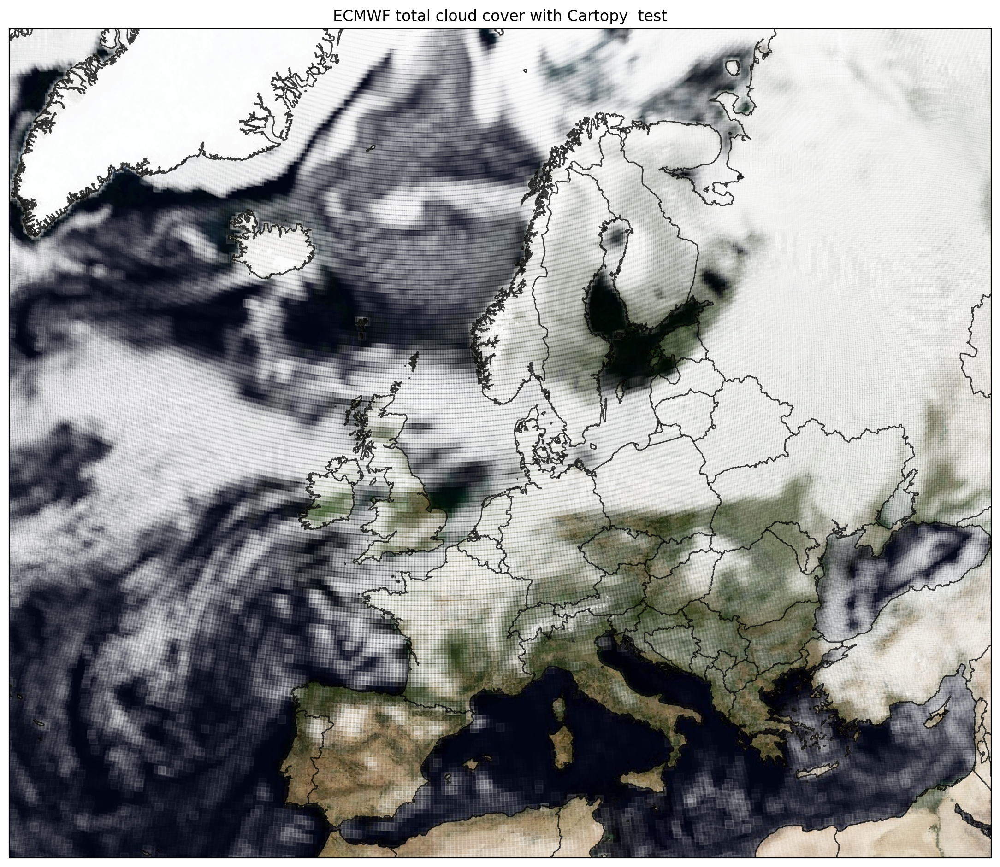

In [18]:
#ax.add_feature(cfeature.LAND, edgecolor='white')
view_latitude=60; view_longitude=0;    plot_pos=[0.05,0.05,0.9,0.9]
# Create a figure and axis with Cartopy projection
fig = plt.figure(figsize=(20, 10),dpi=200)
#ax = plt.axes(projection=ccrs.PlateCarree())

crs=ccrs.PlateCarree()
ax = plt.subplot(1, 1, 1, projection=ccrs.Orthographic(view_longitude, view_latitude),position=plot_pos)
         
bordercolor='black'; borderalpha=0.5; coastcolor='black';coastalpha=0.5
# Add coastlines and other features
#ax.coastlines()
#ax.add_feature(cfeature.BORDERS, linestyle=':')

europe_east = 35; europe_west = -25; europe_north = 75; europe_south = 30 
europe_mapextent=[europe_west, europe_east, europe_south, europe_north]
ax.set_extent(europe_mapextent)

#get high res country borders  
#https://www.naturalearthdata.com/downloads/10m-cultural-vectors/
borders_10m = carfeat.NaturalEarthFeature('cultural', 'admin_0_countries', '10m', facecolor='none',edgecolor=bordercolor)
ax.add_feature(borders_10m,alpha=borderalpha)
#get high res state borders
#provinces_50m = carfeat.NaturalEarthFeature('cultural','admin_1_states_provinces_lines','50m',facecolor='none',edgecolor=bordercolor)
#ax.add_feature(provinces_50m,alpha=borderalpha)
#add coastlines
ax.coastlines('10m', color=coastcolor,alpha=coastalpha)


ax.imshow(map_img,origin='upper',transform=crs, extent=[-180,180,-90,90])

# Plot the data
#test with colormap
#colors = [(1,1,1,c) for c in np.linspace(0,1,100)]
#cmap1 = mcolors.LinearSegmentedColormap.from_list('mycmap', colors, N=10)

alpha=0.3
cmap1 = LinearSegmentedColormap.from_list('transparent_to_white', [(1, 1, 1, 0), (1, 1, 1, alpha)], N=50)

ax.scatter(lons, lats, c=values, cmap=cmap1, transform=crs, marker='s')



# Plot the data
#plt.scatter(lons, lats, c=values, cmap='grey', s=10, transform=ccrs.PlateCarree())

# Add a colorbar
#plt.colorbar(sc, orientation='horizontal', pad=0.05, aspect=50)

# Add a title
plt.title('ECMWF total cloud cover with Cartopy  '+str(time_ecmwf)[0:16])


# Show the plot
#plt.show()
plt.savefig('results/clouds/europe_ecmwf.png', format='png', bbox_inches='tight')

## ICON

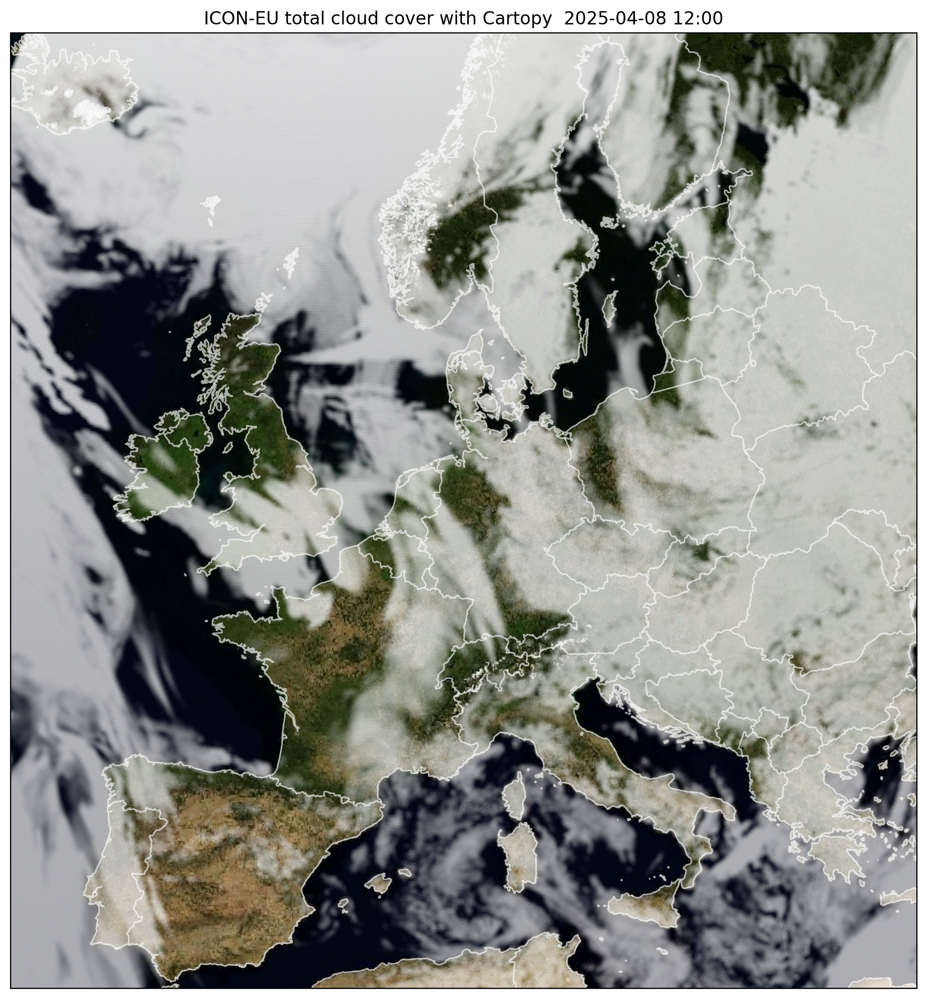

In [19]:
#ax.add_feature(cfeature.LAND, edgecolor='white')
view_latitude=60; view_longitude=0;    plot_pos=[0.05,0.05,0.9,0.9]
# Create a figure and axis with Cartopy projection
fig = plt.figure(figsize=(20, 10),dpi=200)

#ax = plt.axes(projection=ccrs.PlateCarree())

crs=ccrs.PlateCarree()
ax = plt.subplot(1, 1, 1, projection=ccrs.Orthographic(view_longitude, view_latitude),position=plot_pos)


##### borders and coasts parameters depending on background image
if map_type=='marble': bordercolor='white'; borderalpha=0.4; coastcolor='white';coastalpha=0.4
if map_type=='viirs':  bordercolor='white'; borderalpha=0.5; coastcolor='white';coastalpha=0.3
if map_type=='topography': bordercolor='black'; borderalpha=0.4; coastcolor='black';coastalpha=0.1


#bordercolor='black'; borderalpha=0.5; coastcolor='black';coastalpha=0.5
# Add coastlines and other features
#ax.coastlines()
#ax.add_feature(cfeature.BORDERS, linestyle=':')

europe_east = 25; europe_west = -12; europe_north = 66; europe_south = 35 
europe_mapextent=[europe_west, europe_east, europe_south, europe_north]
ax.set_extent(europe_mapextent)

#get high res country borders  
#https://www.naturalearthdata.com/downloads/10m-cultural-vectors/
borders_10m = carfeat.NaturalEarthFeature('cultural', 'admin_0_countries', '10m', facecolor='none',edgecolor=bordercolor)
ax.add_feature(borders_10m,alpha=borderalpha)
#get high res state borders
#provinces_50m = carfeat.NaturalEarthFeature('cultural','admin_1_states_provinces_lines','50m',facecolor='none',edgecolor=bordercolor)
#ax.add_feature(provinces_50m,alpha=borderalpha)
#add coastlines
ax.coastlines('10m', color=coastcolor,alpha=coastalpha)


ax.imshow(map_img,origin='upper',transform=crs, extent=[-180,180,-90,90])


# Plot the data

#test with colormap
#colors = [(1,1,1,c) for c in np.linspace(0,1,100)]
#cmap1 = mcolors.LinearSegmentedColormap.from_list('mycmap', colors, N=10)


#this alpha controls the cloud shade
alpha=0.08
cmap1 = LinearSegmentedColormap.from_list('transparent_to_white', [(1, 1, 1, 0), (1, 1, 1, alpha)], N=20)

ax.scatter(lons2, lats2, c=values2, cmap=cmap1, s=10, transform=crs)

#ax.scatter(lons2, lats2, c=values3, cmap='grey', s=5, transform=crs, alpha=0.5)

#with nan for low values
#ax.scatter(lons2, lats2, c=values3, cmap='grey', s=5, transform=crs, alpha=0.5)



# Add a colorbar
#plt.colorbar(sc, orientation='horizontal', pad=0.05, aspect=50)

# Add a title
plt.title('ICON-EU total cloud cover with Cartopy  '+str(time_icon)[0:16])

# Show the plot
#plt.show()
plt.savefig('results/clouds/europe_icon.png', format='png', bbox_inches='tight')

In [20]:
cloudarr=[lats2,lons2,values2,time_icon]
filedump='data/icon-eu-pickle/icon_test.pickle'
pickle.dump(cloudarr, open(filedump, 'wb'))
